In [1]:
#downloading data
!git clone https://github.com/rslim087a/track

fatal: destination path 'track' already exists and is not an empty directory.


In [2]:
# !pip install imgaug
!pip install --user imgaug


In [39]:
from imgaug import augmenters as iaa

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [5]:
import numpy as np  # Import NumPy library for numerical calculations
import matplotlib.pyplot as plt  # Import Matplotlib library for visualization
import keras  # Importing Keras to build and train neural networks
from keras.models import Sequential  # Import Sequential class for sequential neural network modelsv
from keras.optimizers import Adam  # Import Adam optimizer to adjust weights and biases
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense  # Import Keras layers for CNNs
import cv2  # Importing the OpenCV library for image processing
import pandas as pd  # Import Pandas library for data analysis
import random  # Import random module for random number generation
import os  # Import os module for operating system-related operations
import ntpath  # Import the ntpath module for path and filename manipulation
from sklearn.utils import shuffle  # Import shuffle function from scikit-learn to randomize data
from sklearn.model_selection import train_test_split  # Import train_test_split to split data in training and test
import matplotlib.image as mpimg  # Import Matplotlib library to handle images
from imgaug import augmenters as iaa  # Import imgaug to perform data augmentation
import tensorflow as tf # Import tensorflow library
import math #Import Math library

from tensorflow.keras.models import Sequential #Import Keras Model Sequential
from tensorflow.keras.optimizers import Adam #Import Adam Optimzer

In [6]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', 0)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [7]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


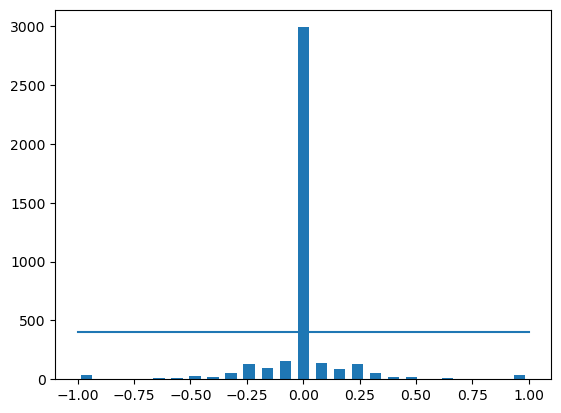

In [8]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [9]:

print('total data:', len(data))
print(data.shape)

total data: 4053
(4053, 7)


In [10]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 2590
remaining: 1463


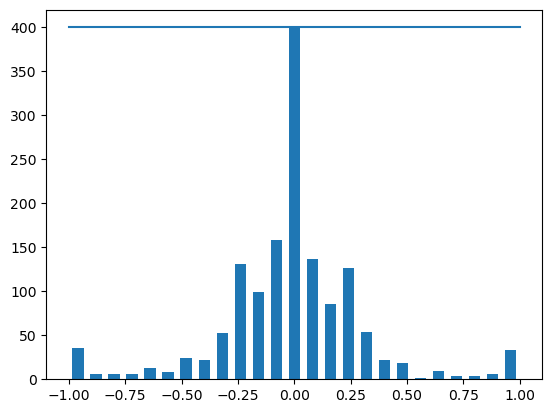

In [11]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [12]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [13]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [14]:
len(image_paths)

4389

In [15]:
len(steerings)

4389

In [16]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))
     

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation set')

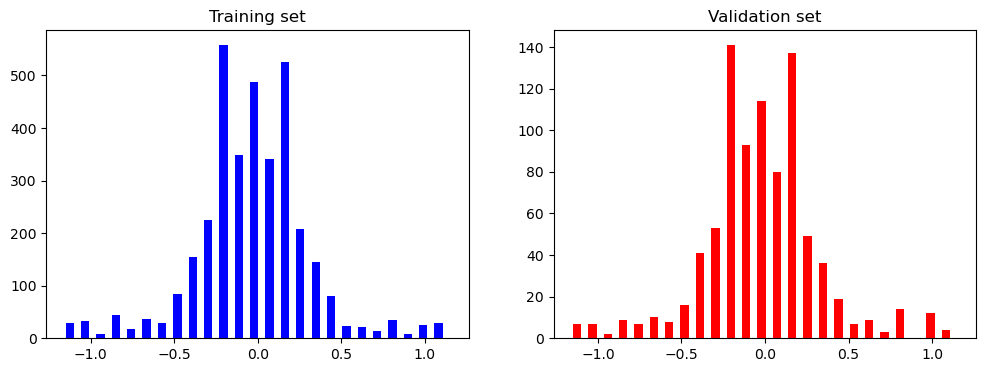

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

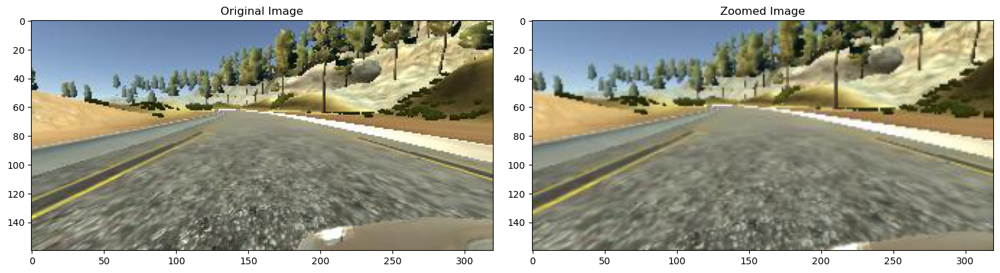

In [18]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

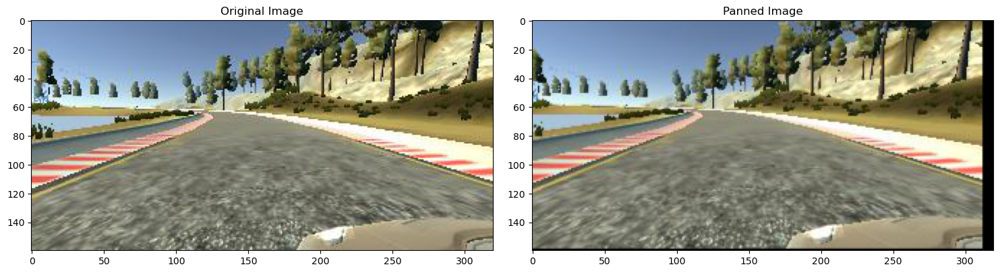

In [19]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

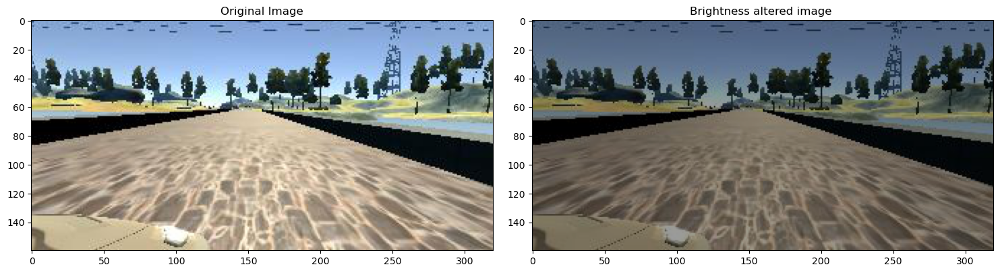

In [20]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ') 

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.4')

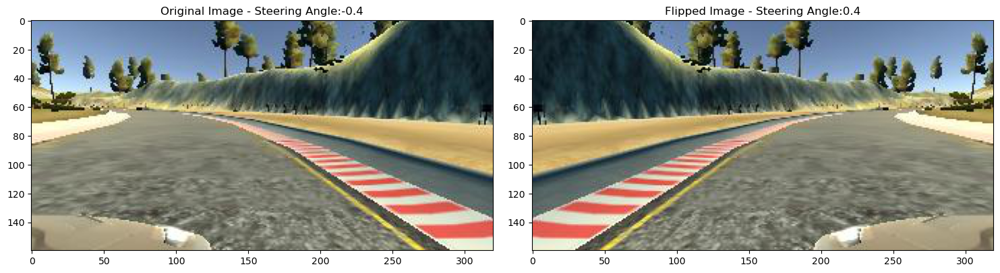

In [21]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [22]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

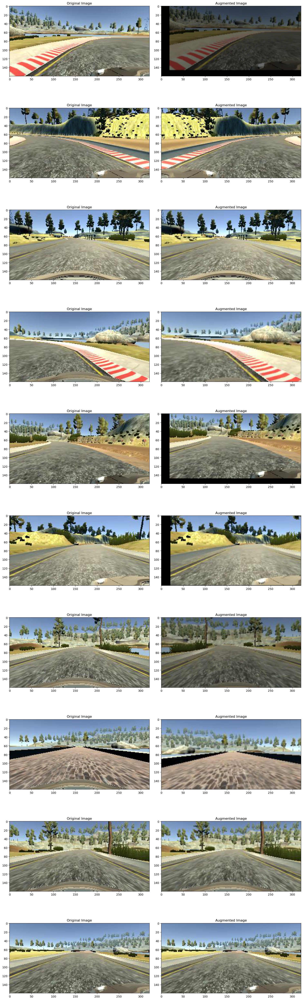

In [23]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [24]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

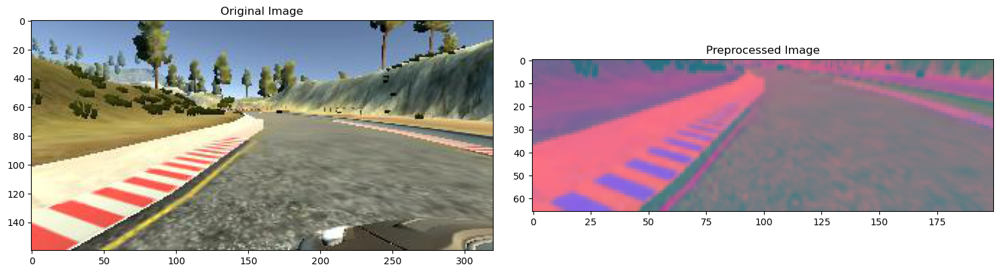

In [25]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [26]:
!nvidia-smi

'nvidia-smi' is not recognized as an internal or external command,
operable program or batch file.


In [27]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [28]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

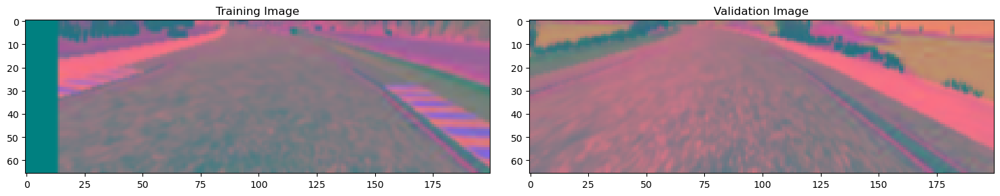

In [29]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [30]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  # model.add(Conv2D(64, (3,3), activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mean_squared_error', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

C:\Users\HP\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 1, 18, 64)      │        76,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


In [31]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=3,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/3
300/300 ━━━━━━━━━━━━━━━━━━━━ 309s 1s/step - loss: 0.5546 - val_loss: 0.1125
Epoch 2/3
300/300 ━━━━━━━━━━━━━━━━━━━━ 284s 949ms/step - loss: 0.1058 - val_loss: 0.1220
Epoch 3/3
300/300 ━━━━━━━━━━━━━━━━━━━━ 289s 966ms/step - loss: 0.1122 - val_loss: 0.1058


Text(0.5, 0, 'Epoch')

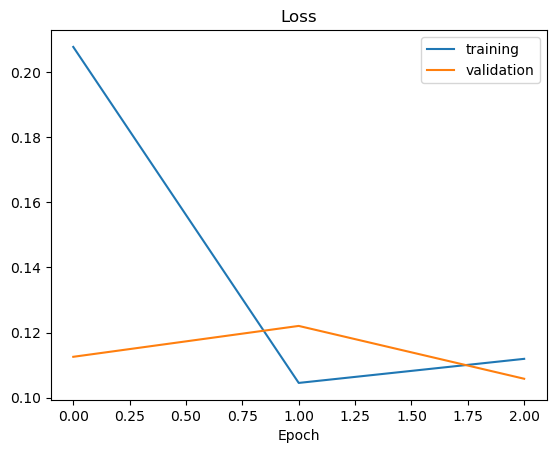

In [32]:

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')


In [33]:
model.save('model.h5')
# from google.colab import files
# files.download('model.h5')

In [34]:
import socketio
import eventlet
import numpy as np
from flask import Flask
from keras.models import load_model
import base64
from io import BytesIO
from PIL import Image
import cv2

In [35]:
sio = socketio.Server()
 
app = Flask(__name__) #'__main__'
speed_limit = 19
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    aug = iaa.Sharpen(alpha=(1), lightness=(1.5))
    img = aug.augment_image(img)
    
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))

    image_bgr = cv2.cvtColor(img, cv2.COLOR_YUV2BGR)
    image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    1.3 / 1.7
    edges = cv2.Canny(image_gray, threshold1=280, threshold2=300)

    lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi/180, threshold=40, minLineLength=110, maxLineGap=10) # Para zoom 1.3 / 1.7
    
    if lines is not None:
      for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(image_bgr, (x1, y1), (x2, y2), (0, 0, 255), 2)

    if lines is not None:
      for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(img, (x1,y1), (x2, y2), (0, 255, 255),2)

    img = (img/255).astype(np.float32)
    img = tf.convert_to_tensor(img)
    return img

In [36]:
@sio.on('telemetry')
def telemetry(sid, data):
    speed = float(data['speed'])
    image = Image.open(BytesIO(base64.b64decode(data['image'])))
    image = np.asarray(image)
    image = img_preprocess(image)
    image = np.array([image])
    steering_angle = float(model.predict(image))
    throttle = 1.0 - speed/speed_limit
    print('{} {} {}'.format(steering_angle, throttle, speed))
    send_control(steering_angle, throttle)

In [37]:
@sio.on('connect')
def connect(sid, environ):
    print('Connected')
    send_control(0, 0)
 
def send_control(steering_angle, throttle):
    sio.emit('steer', data = {
        'steering_angle': steering_angle.__str__(),
        'throttle': throttle.__str__()})

In [ ]:
if __name__ == '__main__':
    model = load_model('model.h5')
    app = socketio.Middleware(sio, app)
    eventlet.wsgi.server(eventlet.listen(('', 4567)), app)


(4388) wsgi starting up on http://0.0.0.0:4567
(4388) accepted ('127.0.0.1', 63836)


Connected
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
-0.02708960510790348 0.8616842105263158 2.628
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
-0.02708960510790348 0.8616842105263158 2.628
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
-0.04678803309798241 0.7694736842105263 4.38
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
-0.03914574906229973 0.9703631578947368 0.5631
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
-0.0402064248919487 0.8609842105263158 2.6413
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
-0.03889693319797516 0.7053631578947368 5.5981
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
-0.03640526905655861 0.5290368421052631 8.9483
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
-0.03792988881468773 0.4308526315789474 10.8138
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
-0.03563022240996361 0.3398473684210527 12.5429
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
-0.03584885597229004 0.22012631578947361 14.8176
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
-0.03129114210605621 0.14514210526315785 16.2423
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
0.0028245674911

(4388) accepted ('127.0.0.1', 63878)


Connected
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
-0.028326889500021935 1.0 0.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
-0.028326889500021935 1.0 0.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
-0.028325935825705528 0.9769473684210527 0.438
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
-0.04175090417265892 0.954121052631579 0.8717
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
-0.03902395814657211 0.7669684210526315 4.4276
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
-0.038593221455812454 0.4494947368421053 10.4596
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
-0.03780296444892883 0.2785684210526316 13.7072
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
-0.03356558829545975 0.03344736842105267 18.3645
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
-0.025071918964385986 -0.1342684210526317 21.5511
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
-0.01829974353313446 -0.21106842105263168 23.0103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
-0.014436086639761925 -0.2235631578947368 23.2477
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
-0.0013144942931830883 -0.1

127.0.0.1 - - [27/Aug/2024 19:24:50] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 189.177637
(4388) accepted ('127.0.0.1', 63895)


Connected
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
-0.08448383957147598 1.0 0.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
-0.08448383957147598 1.0 0.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
-0.08448383957147598 1.0 0.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
-0.08162963390350342 0.9877631578947368 0.2325
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
-0.08161032944917679 0.6334684210526316 6.9641
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
-0.07487992942333221 0.1884157894736842 15.4201
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
-0.014940448105335236 -0.20518947368421037 22.8986
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
0.0038178146351128817 0.6671947368421053 6.3233
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
0.014184871688485146 0.9953 0.0893
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
0.014313017949461937 0.9992473684210527 0.0143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
0.013488015159964561 0.9976842105263158 0.044
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
0.012353567406535149 0.9967842105263158 0.0611
1/1 ━━━━━━━━━━━━━━━

127.0.0.1 - - [27/Aug/2024 19:25:23] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 90.829538
127.0.0.1 - - [27/Aug/2024 19:26:12] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 77.621067
(4388) accepted ('127.0.0.1', 63932)


Connected
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
-0.027354804798960686 1.0 0.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
-0.027354804798960686 1.0 0.0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
-0.02735075168311596 0.9769473684210527 0.438
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
-0.041007570922374725 0.9571052631578947 0.815
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
-0.038344211876392365 0.622278947368421 7.1767
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
-0.03956679627299309 0.2524684210526317 14.2031
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 702ms/step
-0.032345402985811234 -0.11373157894736852 21.1609
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
-0.024965140968561172 -0.4367210526315788 27.2977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
-0.010288067162036896 -0.5775736842105264 29.9739
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
0.0573389008641243 -0.5582473684210527 29.6067
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
0.18143139779567719 -0.4536842105263159 27.62
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
0.4303487241268158 -0.34728421

127.0.0.1 - - [27/Aug/2024 19:26:48] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 19.367293
